In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import bokeh
from bokeh.charts import Bar, output_file, show
from bokeh.io import output_notebook
from bokeh.palettes import Category20
output_notebook()

Loading BokehJS ...

In [72]:
results_df = pd.DataFrame.from_csv('results_df.csv')
fit_model_df = pd.DataFrame.from_csv('fit_model_df.csv')

In [73]:
results_df = results_df.drop(['dtr'], axis = 1)

In [5]:
results_df.head()

,route cluster,performance cluster,userid,features,label,lr,rfr,gbt,dt
workoutid,,,,,,,,,
327494888,3,2,12406103,"[0.296969622374,29.2051925659,0.209828388074,7...",9439.0,8246.486038,7593.112032,7763.067887,7502.983471
174621145,3,1,866771,"[0.214295297861,4.77955552469e-07,0.2182132168...",7998.0,6178.226247,6323.221151,6478.544690,6266.860880
11867693,3,0,866771,"[0.193027198315,4.77955552469e-07,0.2182132168...",5610.0,5816.141251,5766.524007,5463.798103,5602.517182
268802906,3,0,866771,"[0.186620146036,4.77955552469e-07,0.2182132168...",5302.0,5662.594811,5437.867667,5353.949540,5309.524038
285918512,3,0,866771,"[0.223394304514,4.77955552469e-07,0.2182132168...",5733.0,6543.895735,6438.714376,6201.447813,6189.503171


In [6]:
results_df['lr residual'] = results_df['label'] - results_df['lr']
results_df['rfr residual'] = results_df['label'] - results_df['rfr']
results_df['gbt residual'] = results_df['label'] - results_df['gbt']
results_df['dt residual'] = results_df['label'] - results_df['dt']

In [7]:
results_df.shape

(290975, 13)

In [8]:
results_df.head()

,route cluster,performance cluster,userid,features,label,lr,rfr,gbt,dt,lr residual,rfr residual,gbt residual,dt residual
workoutid,,,,,,,,,,,,,
327494888,3,2,12406103,"[0.296969622374,29.2051925659,0.209828388074,7...",9439.0,8246.486038,7593.112032,7763.067887,7502.983471,1192.513962,1845.887968,1675.932113,1936.016529
174621145,3,1,866771,"[0.214295297861,4.77955552469e-07,0.2182132168...",7998.0,6178.226247,6323.221151,6478.544690,6266.860880,1819.773753,1674.778849,1519.455310,1731.139120
11867693,3,0,866771,"[0.193027198315,4.77955552469e-07,0.2182132168...",5610.0,5816.141251,5766.524007,5463.798103,5602.517182,-206.141251,-156.524007,146.201897,7.482818
268802906,3,0,866771,"[0.186620146036,4.77955552469e-07,0.2182132168...",5302.0,5662.594811,5437.867667,5353.949540,5309.524038,-360.594811,-135.867667,-51.949540,-7.524038
285918512,3,0,866771,"[0.223394304514,4.77955552469e-07,0.2182132168...",5733.0,6543.895735,6438.714376,6201.447813,6189.503171,-810.895735,-705.714376,-468.447813,-456.503171


In [9]:
columns = ['label', 'lr', 'lr residual', 'rfr', 'rfr residual', 'gbt', 'gbt residual', 'dt', 'dt residual']

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fedab16c110>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7feda251a850>]], dtype=object)

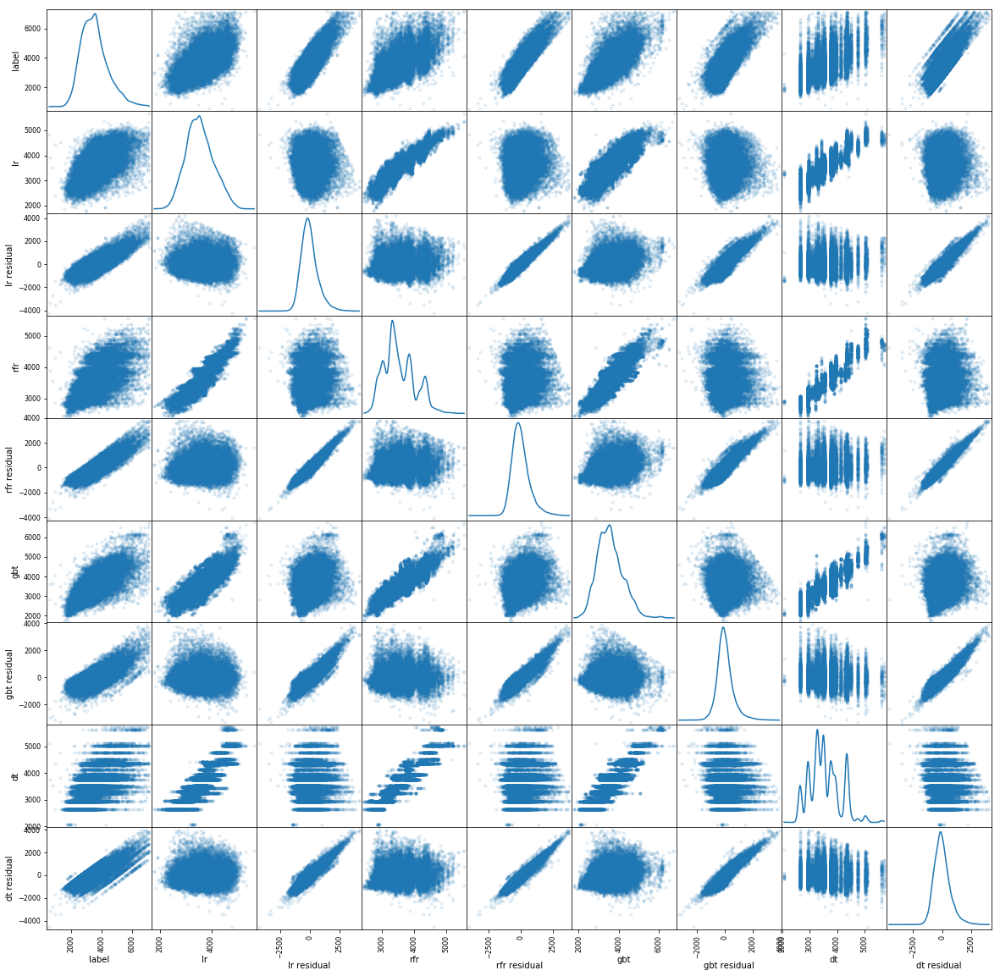

In [9]:
pd.tools.plotting.scatter_matrix(results_df[(results_df['route cluster'] == 0) & (results_df['performance cluster'] == 0)][columns], alpha = 0.1, figsize = (20, 20), diagonal = 'kde')

For Route Cluster 3 and Performance Cluster 2:


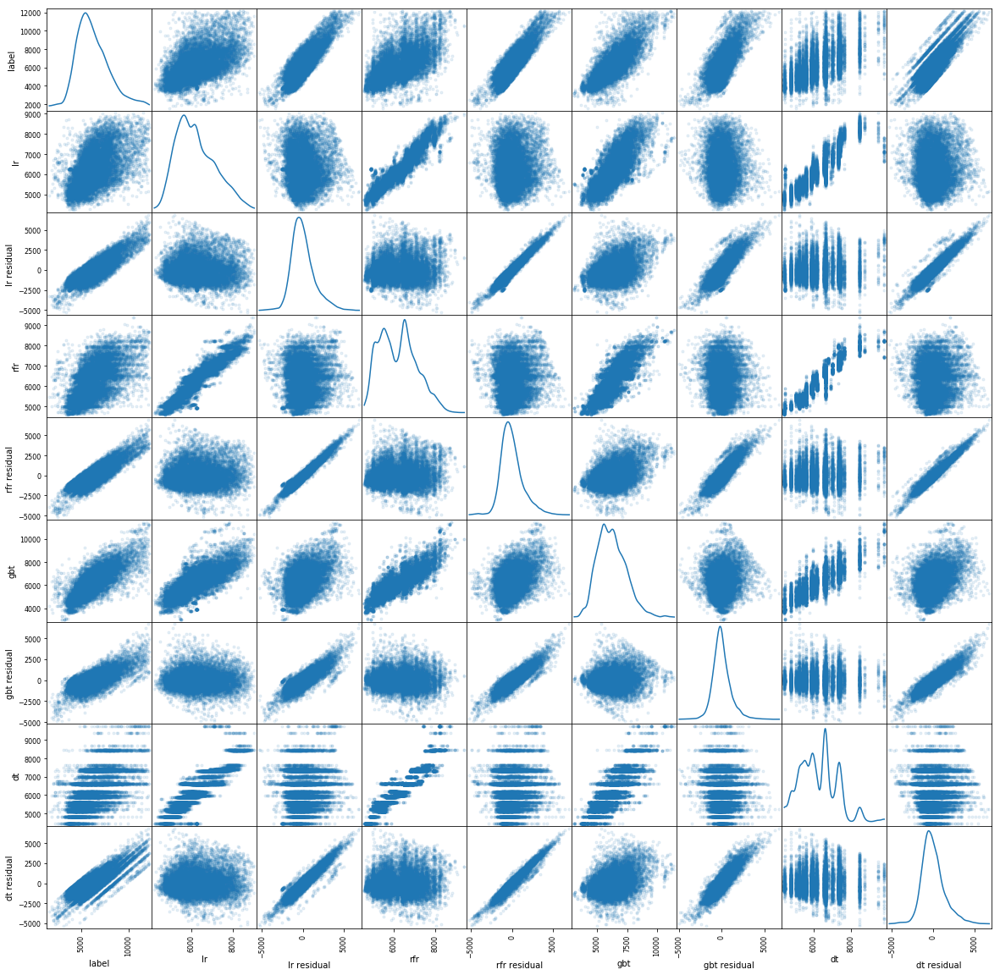

For Route Cluster 3 and Performance Cluster 1:


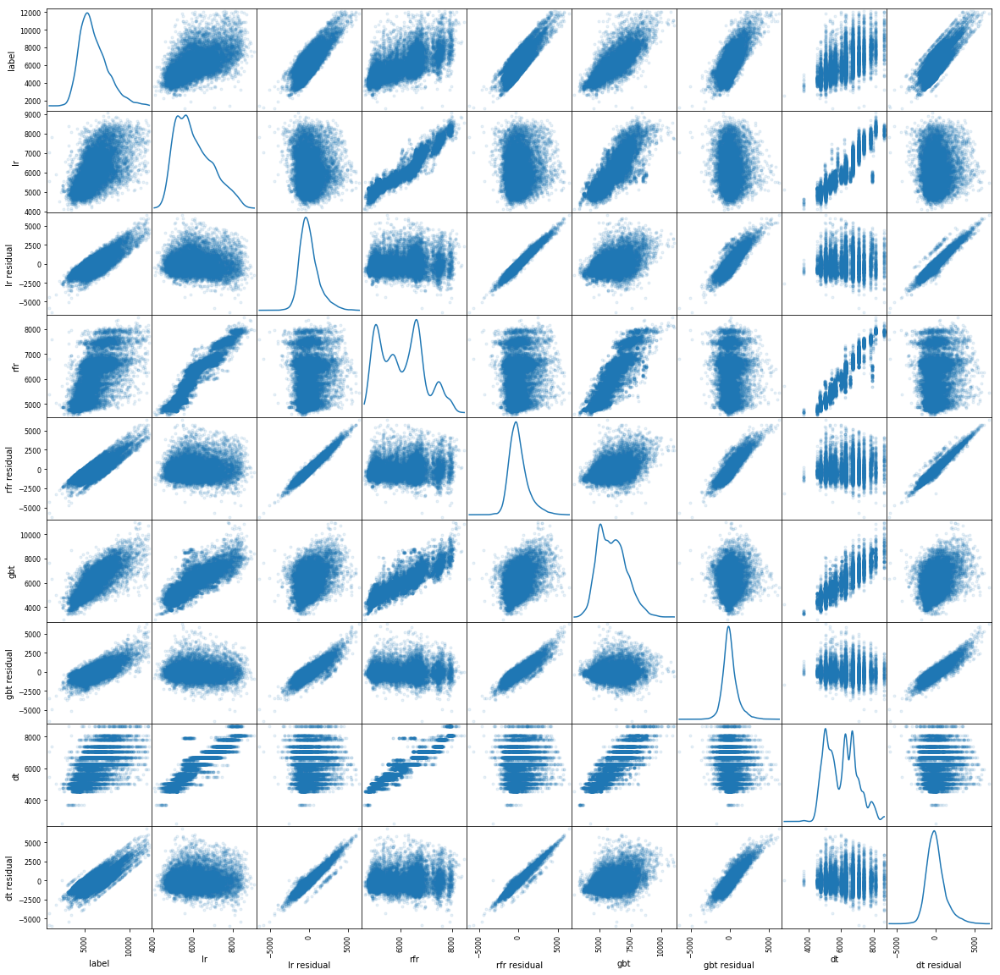

For Route Cluster 3 and Performance Cluster 0:


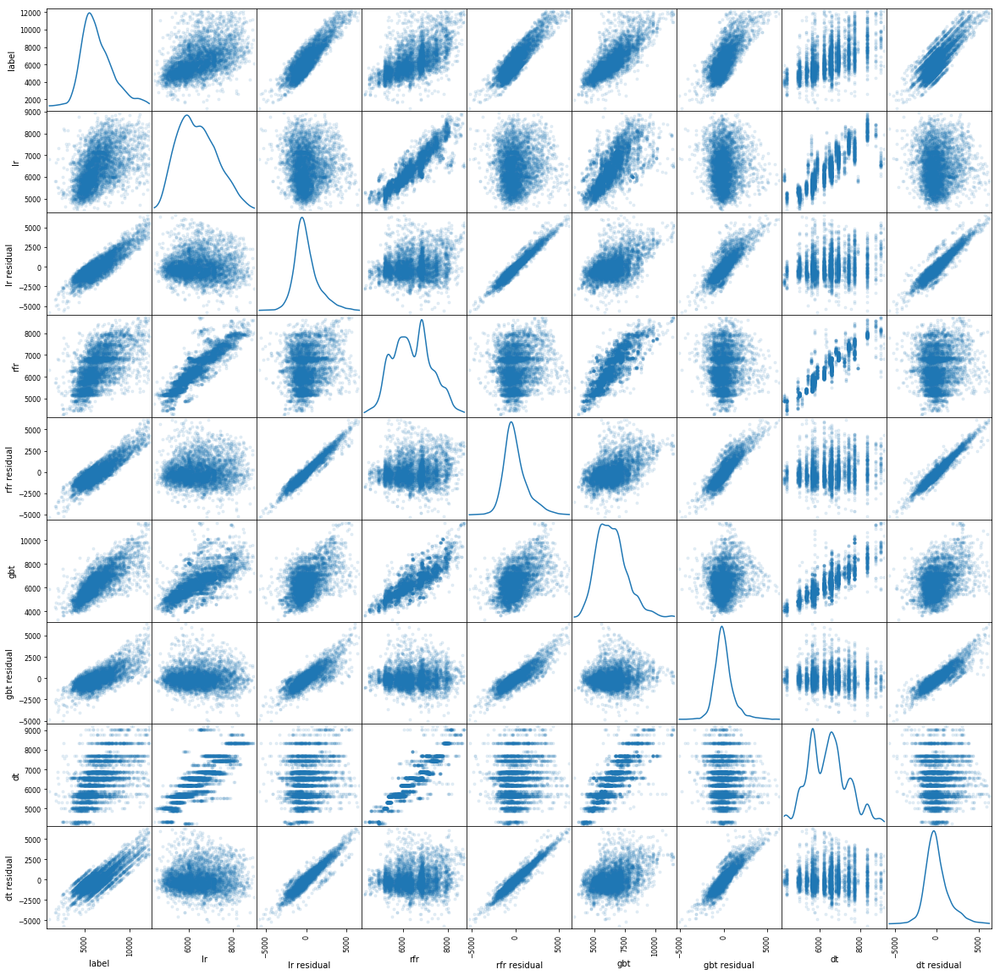

For Route Cluster 4 and Performance Cluster 2:


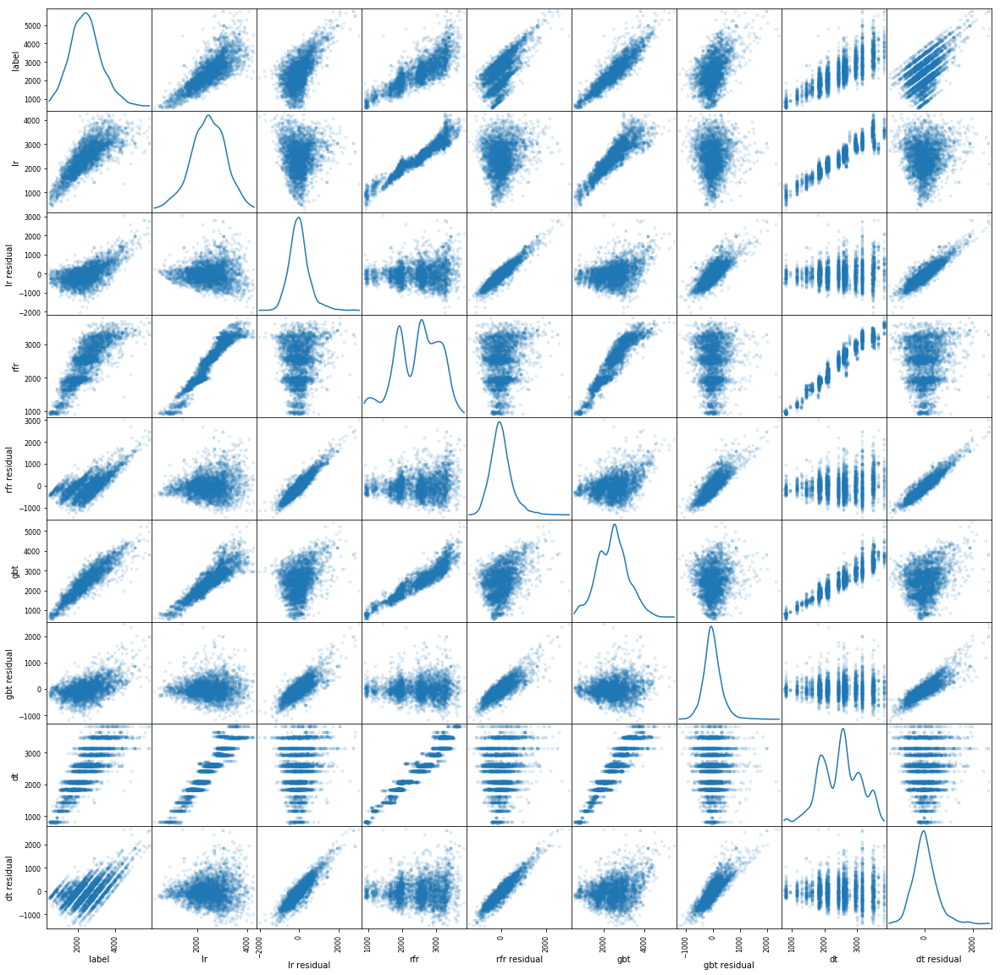

For Route Cluster 4 and Performance Cluster 1:


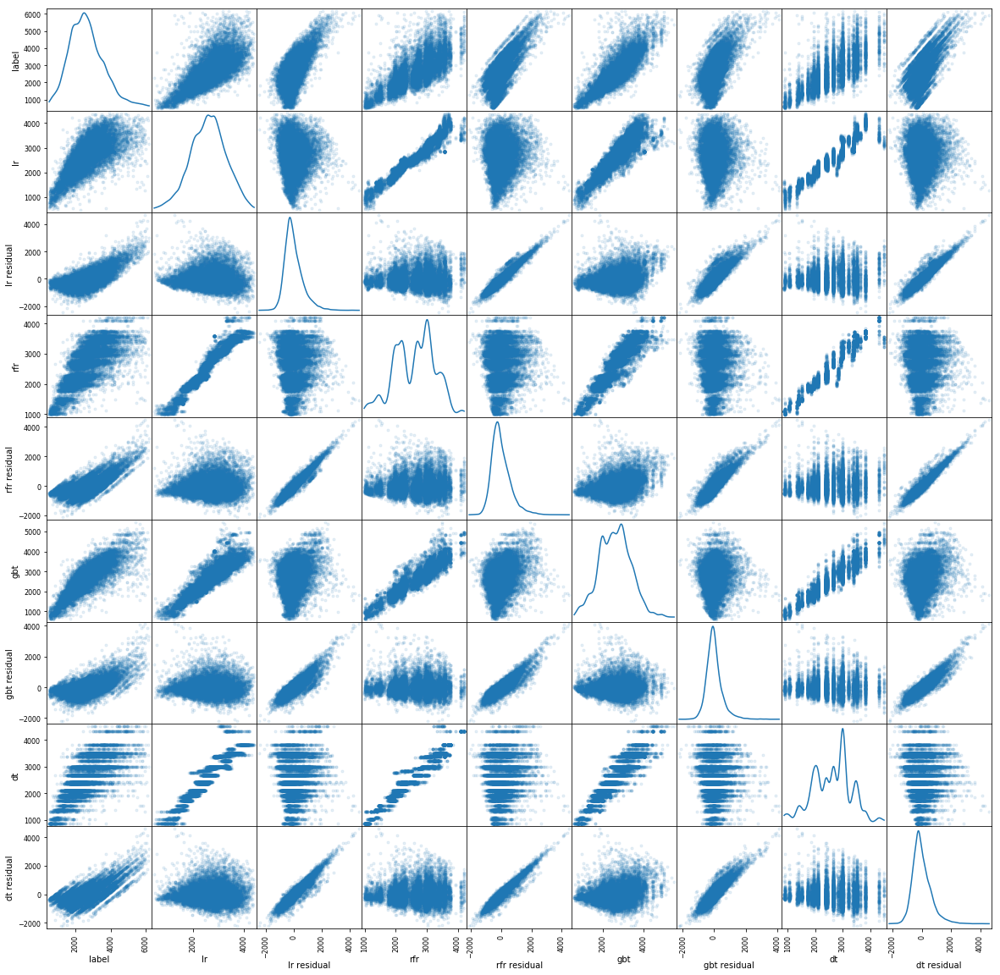

For Route Cluster 4 and Performance Cluster 0:


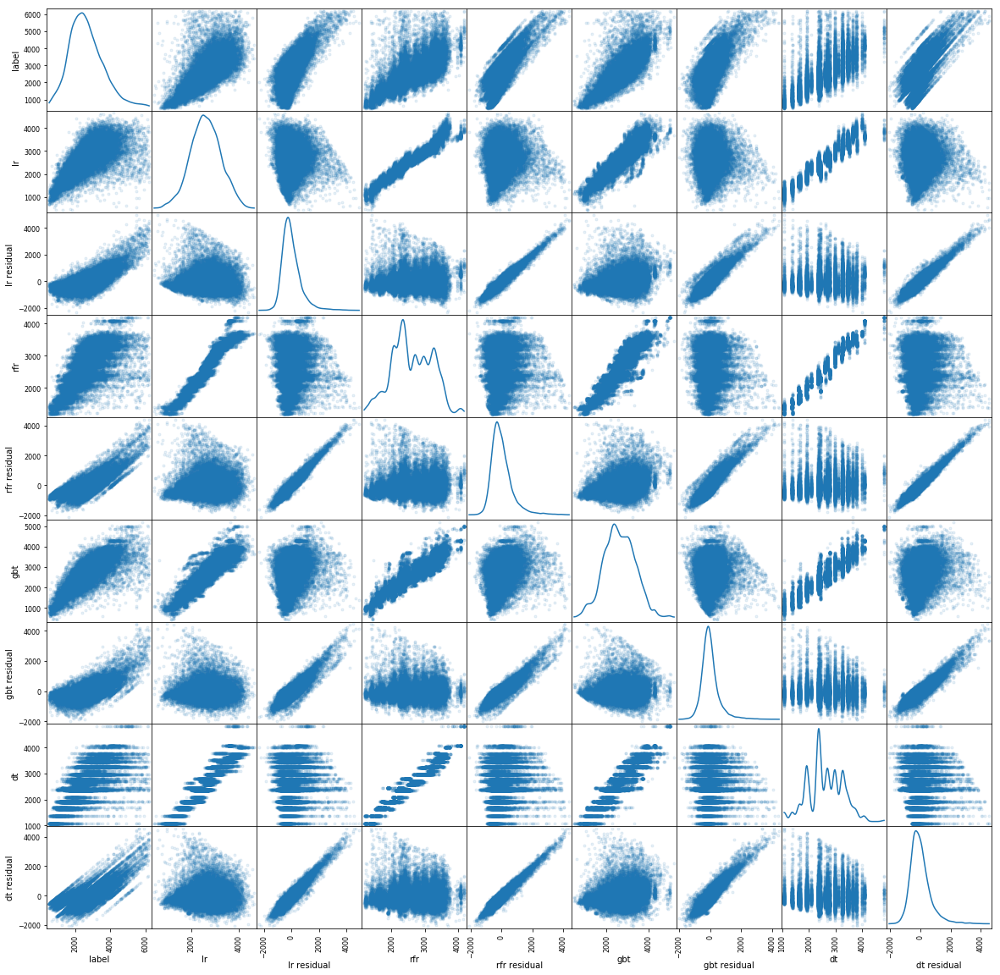

For Route Cluster 2 and Performance Cluster 2:


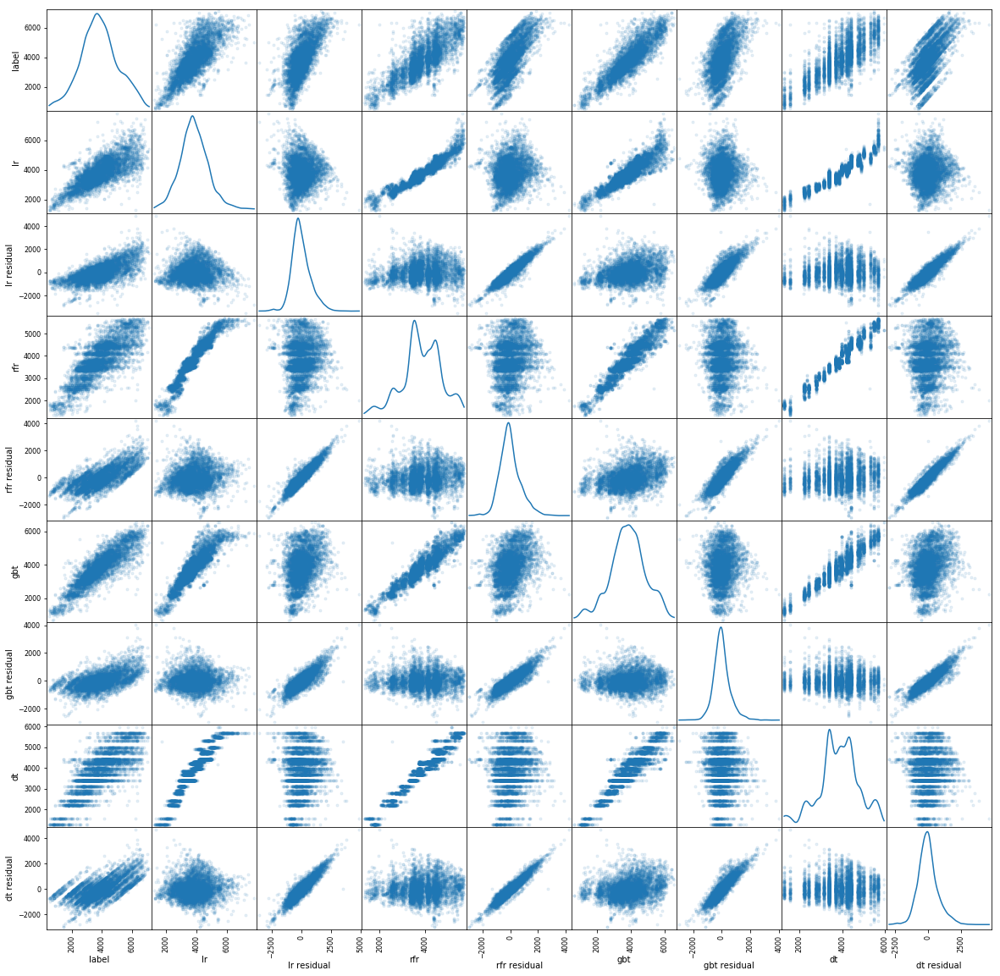

For Route Cluster 2 and Performance Cluster 1:


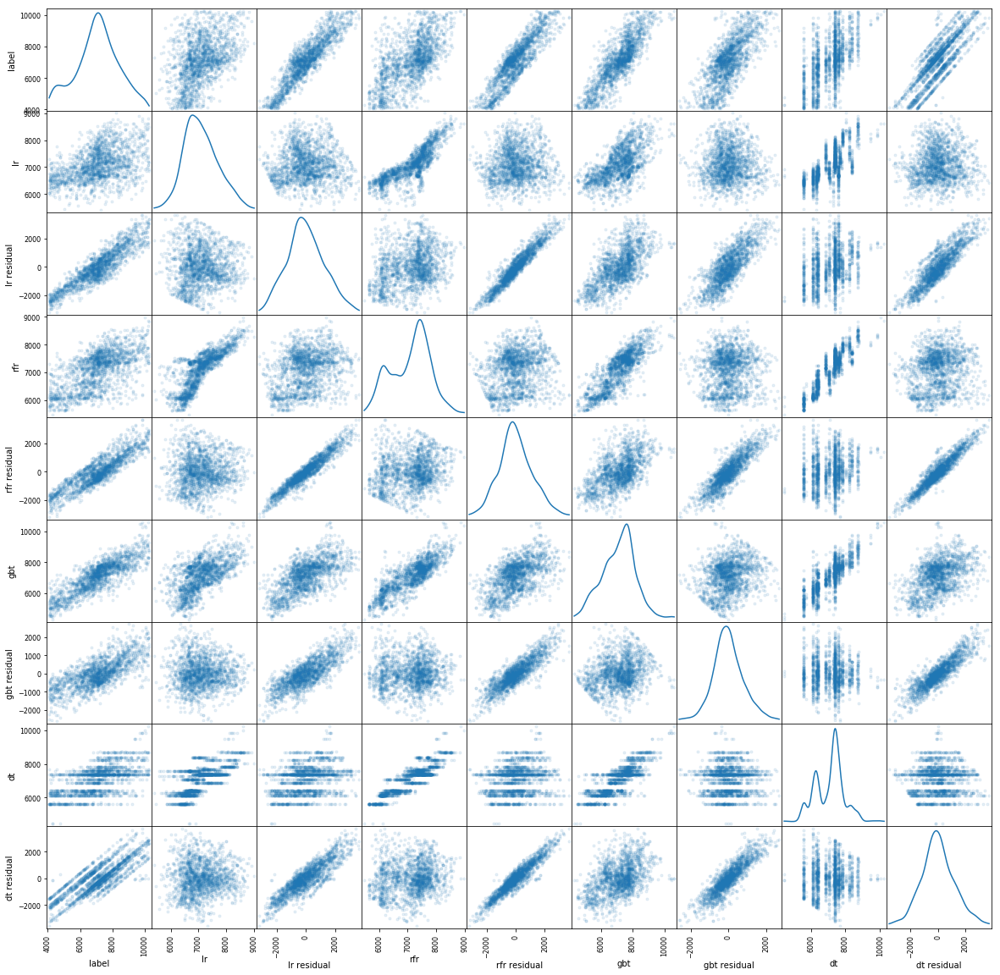

For Route Cluster 2 and Performance Cluster 0:


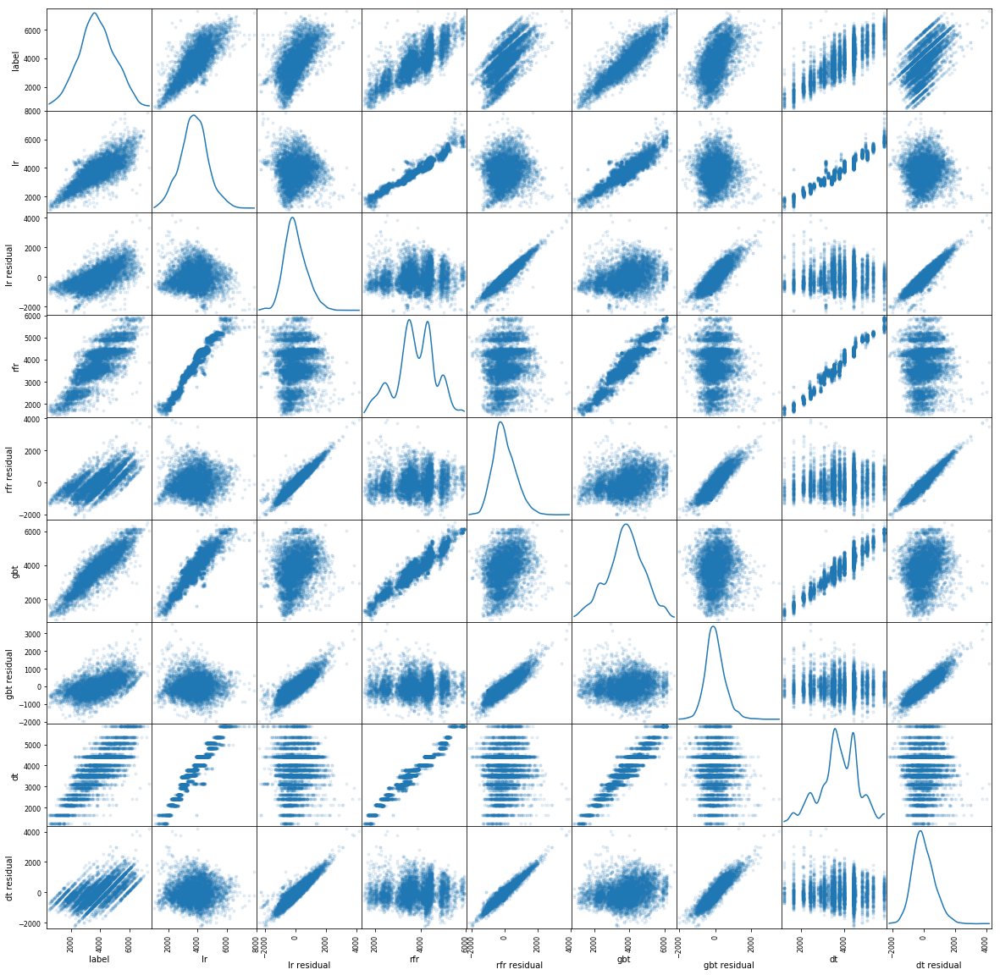

For Route Cluster 0 and Performance Cluster 2:


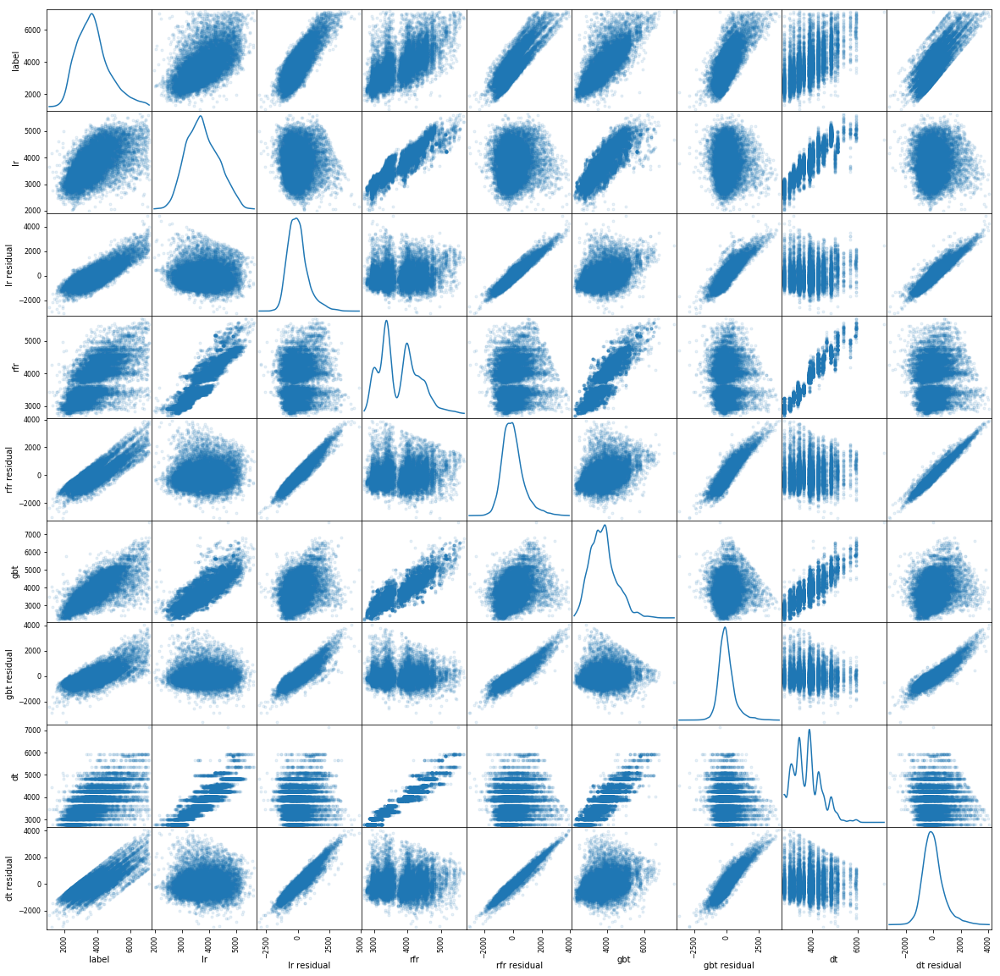

For Route Cluster 0 and Performance Cluster 1:


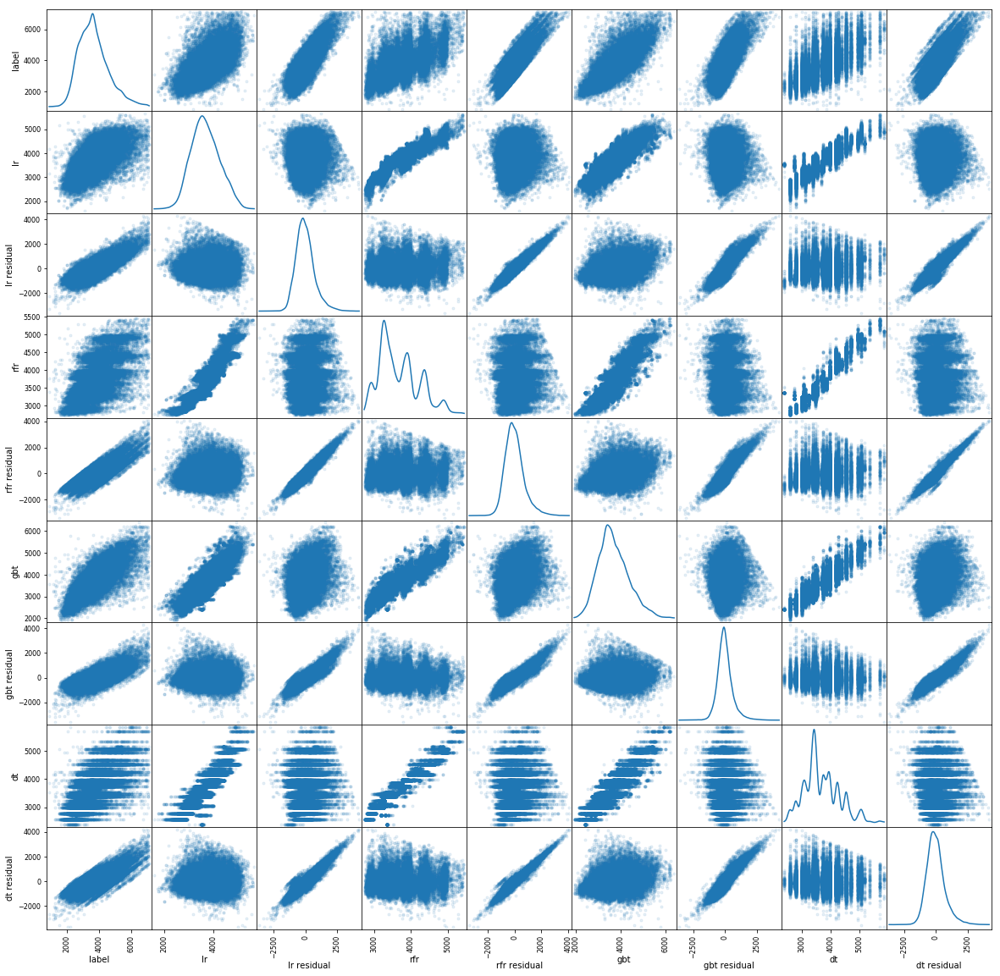

For Route Cluster 0 and Performance Cluster 0:


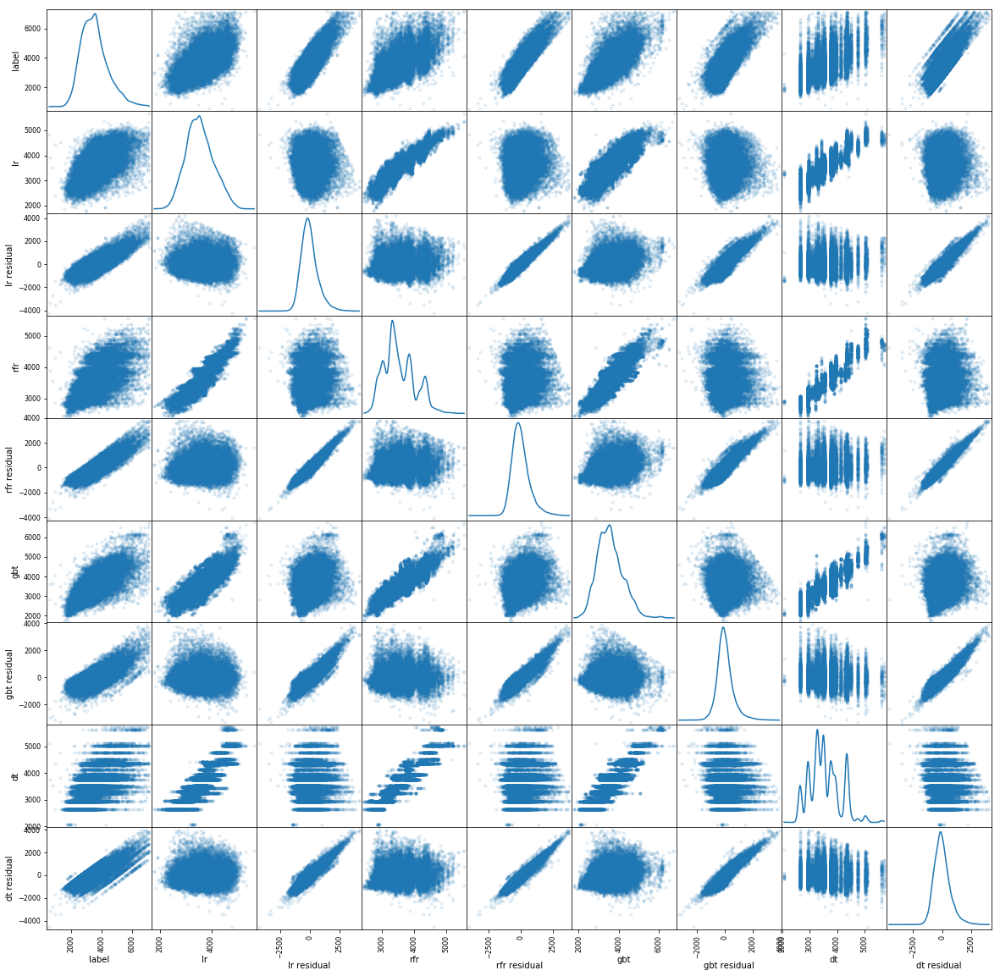

For Route Cluster 1 and Performance Cluster 2:


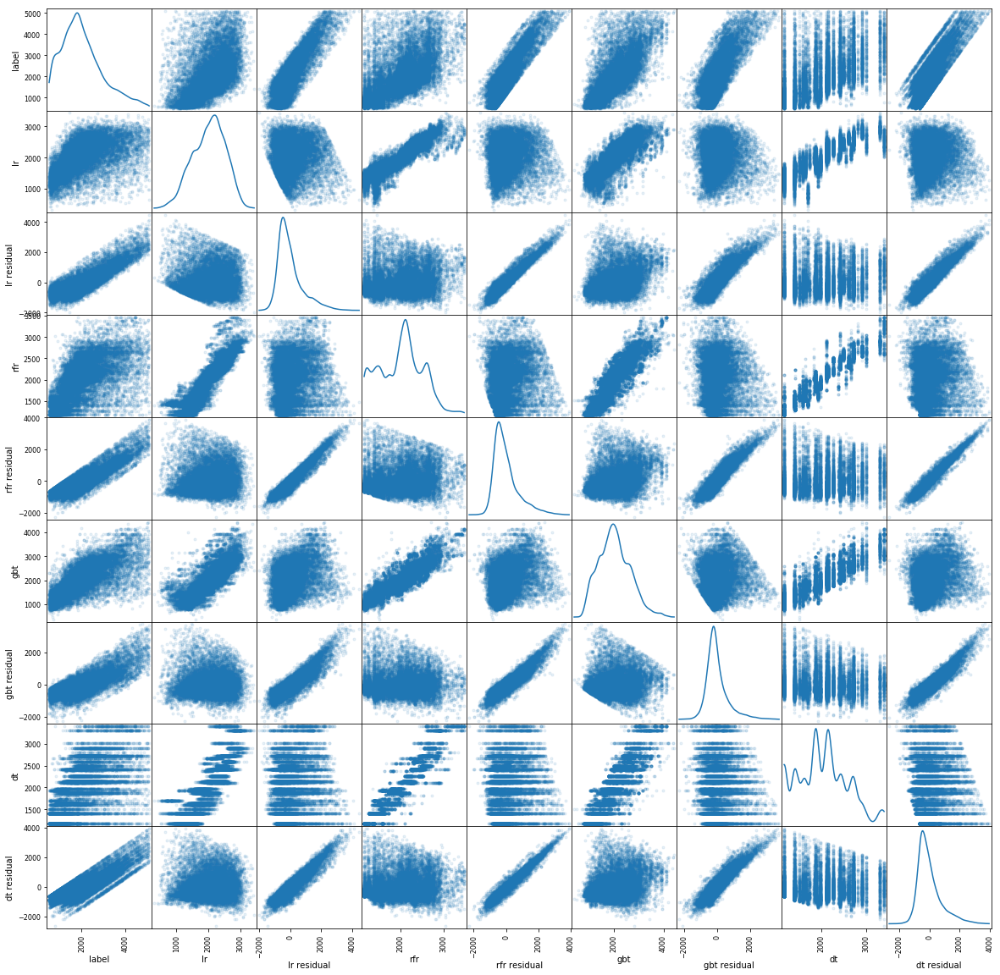

For Route Cluster 1 and Performance Cluster 1:


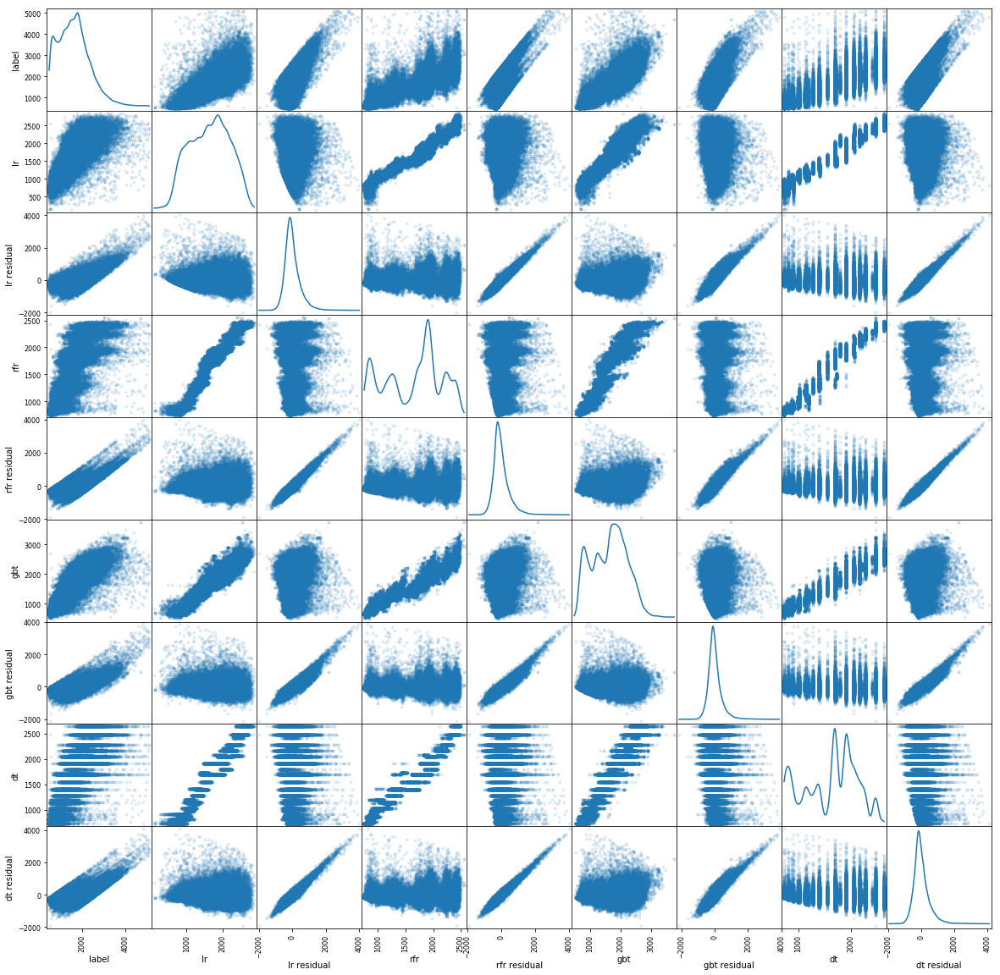

For Route Cluster 1 and Performance Cluster 0:


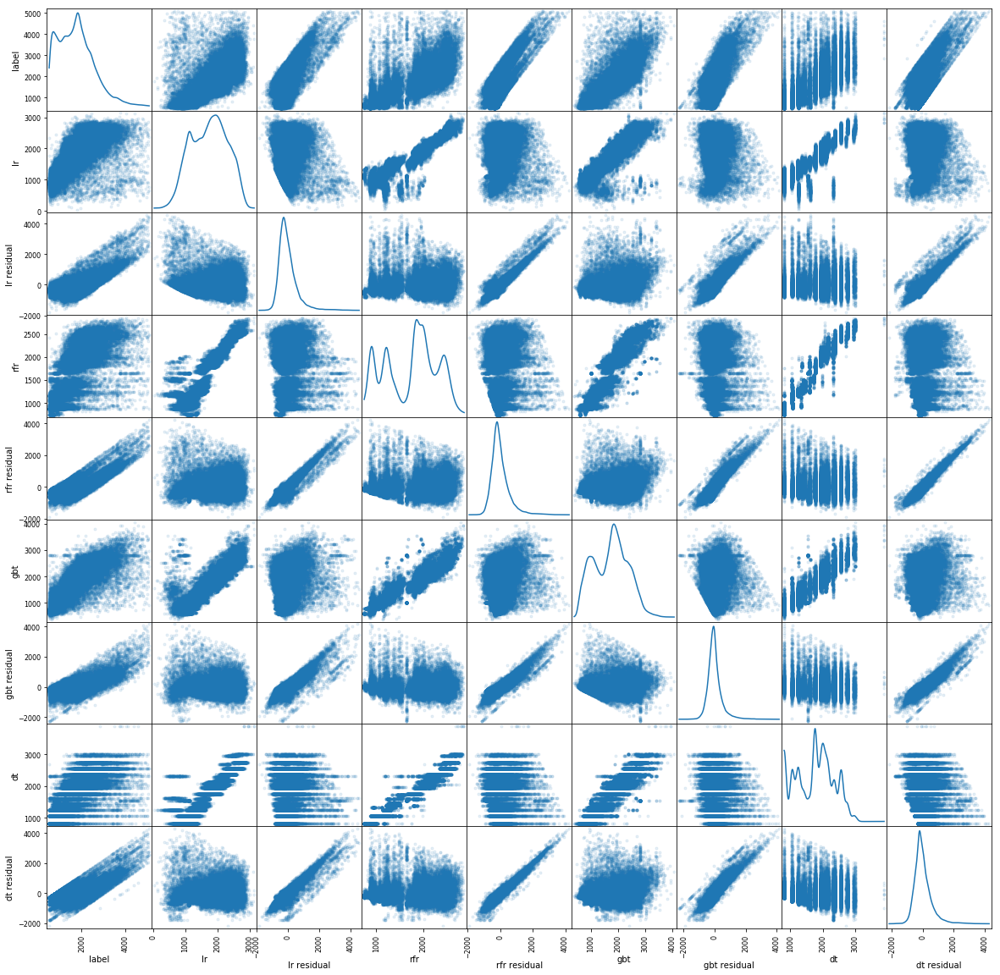

In [27]:
for i in results_df['route cluster'].unique():
    for n in results_df['performance cluster'].unique():
        print("For Route Cluster %d and Performance Cluster %d:" % (i, n))
        
        plot_df = results_df[(results_df['route cluster'] == i) & (results_df['performance cluster'] == n)][columns]
        
        pd.tools.plotting.scatter_matrix(plot_df, alpha = 0.1, figsize = (20, 20), diagonal = 'kde')
        plt.show()

In [11]:
fit_model_df = fit_model_df.reset_index()

In [12]:
fit_model_df['route cluster'] = fit_model_df['index'].str[5]
fit_model_df['performance cluster'] = fit_model_df['index'].str[11]

In [14]:
fit_model_df = fit_model_df.set_index(['route cluster', 'performance cluster'])

In [15]:
fit_model_df['cluster mean'] = 0
fit_model_df['cluster standard deviation'] = 0

In [16]:
fit_model_df.loc[('4','2'), 'mae']

route cluster  performance cluster
4              2                      366.640769
               2                      248.002719
               2                      381.502855
               2                      355.862395
Name: mae, dtype: float64

In [17]:
route_cluster_numbers = results_df['route cluster'].unique()
performance_cluster_numbers = results_df['performance cluster'].unique()

In [18]:
for i in route_cluster_numbers:
    for n in performance_cluster_numbers:
        fit_model_df.loc[(str(i), str(n)),'cluster mean'] \
                      = results_df[(results_df['route cluster'] == i) \
                            & (results_df['performance cluster'] == n)]['label'].mean()

        fit_model_df.loc[(str(i), str(n)),'cluster standard deviation'] \
                     = results_df[(results_df['route cluster'] == i) \
                            & (results_df['performance cluster'] == n)]['label'].std()



In [20]:
fit_model_df['std - rmse'] = fit_model_df['cluster standard deviation'] - fit_model_df['rmse']
fit_model_df['std - mae'] = fit_model_df['cluster standard deviation'] - fit_model_df['mae']
fit_model_df['% drop of std - rmse vs mean'] = fit_model_df['std - rmse']/ fit_model_df['cluster mean']
fit_model_df['% drop of std - mae vs mean'] = fit_model_df['std - mae']/ fit_model_df['cluster mean']

In [21]:
fit_model_df['% std'] = fit_model_df['cluster standard deviation']/fit_model_df['cluster mean']
fit_model_df['% rmse'] = fit_model_df['rmse']/fit_model_df['cluster mean']
fit_model_df['% mae'] = fit_model_df['mae']/fit_model_df['cluster mean']

In [25]:
fit_model_df['model type'] = fit_model_df['index'].str[13:]

In [26]:
fit_model_df.head()

index  \
route cluster performance cluster                     
0             0                     Route0_Perf0_dt   
              0                    Route0_Perf0_gbt   
              0                     Route0_Perf0_lr   
              0                    Route0_Perf0_rfr   
              1                     Route0_Perf1_dt   

                                                                                path  \
route cluster performance cluster                                                      
0             0                    /home/ubuntu/Regression_5th_Iteration/Models/R...   
              0                    /home/ubuntu/Regression_5th_Iteration/Models/R...   
              0                    /home/ubuntu/Regression_5th_Iteration/Models/R...   
              0                    /home/ubuntu/Regression_5th_Iteration/Models/R...   
              1                    /home/ubuntu/Regression_5th_Iteration/Models/R...   

                                          mae        r2        rmse  \
route cluster performance cluster                                     
0             0                    529.494504  0.384126  697.277770   
              0                    431.621336  0.556981  591.385644   
              0                    544.488171  0.354878  713.642488   
              0                    526.111130  0.392530  692.503826   
              1                    545.740507  0.407843  719.008217   

                                   cluster mean  cluster standard deviation  \
route cluster performance cluster                                             
0             0                     3555.609900                  888.516473   
              0                     3555.609900                  888.516473   
              0                     3555.609900                  888.516473   
              0                     3555.609900                  888.516473   
              1                     3675.835313                  934.374180   

                                   std - rmse   std - mae  \
route cluster performance cluster                           
0             0                    191.238703  359.021969   
              0                    297.130829  456.895137   
              0                    174.873985  344.028302   
              0                    196.012647  362.405343   
              1                    215.365963  388.633672   

                                   % drop of std - rmse vs mean  \
route cluster performance cluster                                 
0             0                                        0.053785   
              0                                        0.083567   
              0                                        0.049183   
              0                                        0.055128   
              1                                        0.058590   

                                   % drop of std - mae vs mean     % std  \
route cluster performance cluster                                          
0             0                                       0.100973  0.249891   
              0                                       0.128500  0.249891   
              0                                       0.096756  0.249891   
              0                                       0.101925  0.249891   
              1                                       0.105727  0.254194   

                                     % rmse     % mae model type  
route cluster performance cluster                                 
0             0                    0.196106  0.148918         dt  
              0                    0.166325  0.121392        gbt  
              0                    0.200709  0.153135         lr  
              0                    0.194764  0.147966        rfr  
              1                    0.195604  0.148467         dt

In [35]:
fit_model_df.reset_index().sort_values('% rmse').to_csv('fit_model_evaluations.csv')
fit_model_df.reset_index().sort_values('% rmse')

,route cluster,performance cluster,index,path,mae,r2,rmse,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type
29,2,1,Route2_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,600.613998,0.693696,778.369730,7098.525027,1406.777632,628.407902,806.163634,0.088527,0.113568,0.198179,0.109652,0.084611,gbt
57,4,2,Route4_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,248.002719,0.835713,340.550292,2445.923397,840.303289,499.752997,592.300571,0.204321,0.242158,0.343553,0.139232,0.101394,gbt
25,2,0,Route2_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,411.278014,0.793793,538.818789,3763.076525,1186.662243,647.843454,775.384229,0.172158,0.206051,0.315344,0.143186,0.109293,gbt
33,2,2,Route2_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,427.809315,0.763257,583.643617,3844.370226,1199.631751,615.988134,771.822435,0.160231,0.200767,0.312049,0.151818,0.111282,gbt
41,3,1,Route3_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,689.221090,0.619460,951.097485,6044.311823,1541.849446,590.751961,852.628356,0.097737,0.141063,0.255091,0.157354,0.114028,gbt
31,2,1,Route2_Perf1_rfr,/home/ubuntu/Regression_5th_Iteration/Models/R...,882.738726,0.364257,1121.374011,7098.525027,1406.777632,285.403621,524.038906,0.040206,0.073824,0.198179,0.157973,0.124355,rfr
5,0,1,Route0_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,432.063304,0.598188,592.279257,3675.835313,934.374180,342.094923,502.310876,0.093066,0.136652,0.254194,0.161128,0.117542,gbt
28,2,1,Route2_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Models/R...,900.614851,0.327020,1153.747654,7098.525027,1406.777632,253.029978,506.162781,0.035645,0.071305,0.198179,0.162533,0.126874,dt
1,0,0,Route0_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,431.621336,0.556981,591.385644,3555.609900,888.516473,297.130829,456.895137,0.083567,0.128500,0.249891,0.166325,0.121392,gbt
9,0,2,Route0_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,453.266263,0.595519,630.684104,3760.843542,991.693316,361.009211,538.427053,0.095992,0.143167,0.263689,0.167698,0.120522,gbt


In [30]:
fit_model_df.reset_index().groupby(['model type']).mean()

,mae,r2,rmse,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae
model type,,,,,,,,,,,,
dt,622.676175,0.459039,828.552789,3828.234597,1116.418887,287.866098,493.742712,0.089099,0.148073,0.321565,0.232466,0.173492
gbt,471.729531,0.657487,650.242085,3828.234597,1116.418887,466.176802,644.689356,0.135160,0.187665,0.321565,0.186406,0.133900
lr,652.960566,0.415825,862.012716,3828.234597,1116.418887,254.406171,463.458321,0.080470,0.140576,0.321565,0.241095,0.180990
rfr,615.715864,0.473466,816.233845,3828.234597,1116.418887,300.185042,500.703023,0.091957,0.149616,0.321565,0.229608,0.171949


In [31]:
fit_model_df.reset_index().groupby(['model type', 'route cluster']).mean()

mae        r2         rmse  cluster mean  \
model type route cluster                                                     
dt         0               551.771181  0.393287   730.711640   3664.096252   
           1               439.679787  0.473202   602.241777   1797.915931   
           2               672.945426  0.526031   871.049108   4901.990593   
           3              1001.607723  0.344505  1334.789398   6222.595894   
           4               447.376760  0.558168   603.972025   2554.574315   
gbt        0               438.983634  0.583563   604.783002   3664.096252   
           1               358.738233  0.616743   513.304173   1797.915931   
           2               479.900442  0.750249   633.610712   4901.990593   
           3               743.939031  0.613891  1023.988565   6222.595894   
           4               337.086315  0.722989   475.523973   2554.574315   
lr         0               574.204706  0.356808   752.521687   3664.096252   
           1               456.722547  0.433551   624.650435   1797.915931   
           2               728.692224  0.458934   928.871453   4901.990593   
           3              1044.669922  0.296525  1383.115774   6222.595894   
           4               460.513431  0.533308   620.904233   2554.574315   
rfr        0               549.600491  0.402433   725.104090   3664.096252   
           1               437.973054  0.481655   597.291832   1797.915931   
           2               663.974412  0.545552   853.292295   4901.990593   
           3               984.211249  0.370544  1307.904802   6222.595894   
           4               442.820114  0.567148   597.576207   2554.574315   

                          cluster standard deviation  std - rmse   std - mae  \
model type route cluster                                                       
dt         0                              938.194656  207.483016  386.423475   
           1                              823.772796  221.531019  384.093009   
           2                             1264.357209  393.308101  591.411783   
           3                             1647.663774  312.874377  646.056052   
           4                              908.106000  304.133976  460.729240   
gbt        0                              938.194656  333.411654  499.211022   
           1                              823.772796  310.468623  465.034563   
           2                             1264.357209  630.746497  784.456766   
           3                             1647.663774  623.675209  903.724744   
           4                              908.106000  432.582028  571.019685   
lr         0                              938.194656  185.672969  363.989950   
           1                              823.772796  199.122362  367.050249   
           2                             1264.357209  335.485755  535.664984   
           3                             1647.663774  264.548000  602.993852   
           4                              908.106000  287.201768  447.592570   
rfr        0                              938.194656  213.090566  388.594166   
           1                              823.772796  226.480964  385.799742   
           2                             1264.357209  411.064913  600.382797   
           3                             1647.663774  339.758972  663.452526   
           4                              908.106000  310.529794  465.285886   

                          % drop of std - rmse vs mean  \
model type route cluster                                 
dt         0                                  0.056589   
           1                                  0.125853   
           2                                  0.093165   
           3                                  0.050335   
           4                                  0.119555   
gbt        0                                  0.090875   
           1                                  0.174357   
           2                      

In [32]:
fit_model_df.reset_index().groupby(['route cluster']).mean()

,mae,r2,rmse,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae
route cluster,,,,,,,,,,,,
0,528.640003,0.434023,703.280105,3664.096252,938.194656,234.914551,409.554653,0.064059,0.111690,0.255925,0.191866,0.144234
1,423.278405,0.501288,584.372054,1797.915931,823.772796,239.400742,400.494391,0.135571,0.224549,0.456830,0.321260,0.232282
2,636.378126,0.570191,821.705892,4901.990593,1264.357209,442.651317,627.979082,0.103122,0.142419,0.275190,0.172068,0.132772
3,943.606981,0.406366,1262.449635,6222.595894,1647.663774,385.214140,704.056793,0.061951,0.113132,0.264648,0.202697,0.151516
4,421.949155,0.595403,574.494109,2554.574315,908.106000,333.611891,486.156845,0.131156,0.190623,0.355234,0.224078,0.164610


In [45]:
fit_model_df.reset_index().sort_values('% drop of std - rmse vs mean', ascending = False)

,route cluster,performance cluster,index,path,mae,r2,rmse,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type
57,4,2,Route4_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,248.002719,0.835713,340.550292,2445.923397,840.303289,499.752997,592.300571,0.204321,0.242158,0.343553,0.139232,0.101394,gbt
13,1,0,Route1_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,319.165550,0.657279,470.748454,1738.009090,804.124315,333.375861,484.958765,0.191815,0.279031,0.462670,0.270855,0.183639,gbt
17,1,1,Route1_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,284.090006,0.671627,406.469259,1636.209366,709.330280,302.861021,425.240273,0.185099,0.259894,0.433520,0.248421,0.173627,gbt
25,2,0,Route2_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,411.278014,0.793793,538.818789,3763.076525,1186.662243,647.843454,775.384229,0.172158,0.206051,0.315344,0.143186,0.109293,gbt
53,4,1,Route4_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,363.127018,0.706572,508.611800,2607.270658,938.967438,430.355638,575.840420,0.165060,0.220859,0.360134,0.195074,0.139275,gbt
33,2,2,Route2_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,427.809315,0.763257,583.643617,3844.370226,1199.631751,615.988134,771.822435,0.160231,0.200767,0.312049,0.151818,0.111282,gbt
16,1,1,Route1_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Models/R...,333.554572,0.575596,462.097242,1636.209366,709.330280,247.233037,375.775708,0.151101,0.229662,0.433520,0.282419,0.203858,dt
19,1,1,Route1_Perf1_rfr,/home/ubuntu/Regression_5th_Iteration/Models/R...,334.567341,0.575547,462.123879,1636.209366,709.330280,247.206401,374.762939,0.151085,0.229043,0.433520,0.282436,0.204477,rfr
59,4,2,Route4_Perf2_rfr,/home/ubuntu/Regression_5th_Iteration/Models/R...,355.862395,0.677159,477.390815,2445.923397,840.303289,362.912475,484.440894,0.148374,0.198061,0.343553,0.195178,0.145492,rfr
18,1,1,Route1_Perf1_lr,/home/ubuntu/Regression_5th_Iteration/Models/R...,340.716422,0.563120,468.840208,1636.209366,709.330280,240.490072,368.613857,0.146980,0.225285,0.433520,0.286540,0.208235,lr


In [54]:
fit_model_df = fit_model_df.reset_index()

In [62]:
fit_model_df['(Route, Performance) Cluster'] = zip(fit_model_df['route cluster'], fit_model_df['performance cluster'])


In [66]:
fit_model_df.head()

,route cluster,performance cluster,index,path,mae,r2,rmse,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type,"(Route, Performance) Cluster"
0,0,0,Route0_Perf0_dt,/home/ubuntu/Regression_5th_Iteration/Models/R...,529.494504,0.384126,697.277770,3555.609900,888.516473,191.238703,359.021969,0.053785,0.100973,0.249891,0.196106,0.148918,dt,"(0, 0)"
1,0,0,Route0_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Models/R...,431.621336,0.556981,591.385644,3555.609900,888.516473,297.130829,456.895137,0.083567,0.128500,0.249891,0.166325,0.121392,gbt,"(0, 0)"
2,0,0,Route0_Perf0_lr,/home/ubuntu/Regression_5th_Iteration/Models/R...,544.488171,0.354878,713.642488,3555.609900,888.516473,174.873985,344.028302,0.049183,0.096756,0.249891,0.200709,0.153135,lr,"(0, 0)"
3,0,0,Route0_Perf0_rfr,/home/ubuntu/Regression_5th_Iteration/Models/R...,526.111130,0.392530,692.503826,3555.609900,888.516473,196.012647,362.405343,0.055128,0.101925,0.249891,0.194764,0.147966,rfr,"(0, 0)"
4,0,1,Route0_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Models/R...,545.740507,0.407843,719.008217,3675.835313,934.374180,215.365963,388.633672,0.058590,0.105727,0.254194,0.195604,0.148467,dt,"(0, 1)"


In [3]:
fit_model_df = pd.DataFrame.from_csv('fit_model_evaluations.csv')

In [4]:
fit_model_df.columns

Index([u'route cluster', u'performance cluster', u'index', u'path', u'mae',
       u'r2', u'rmse', u'cluster mean', u'cluster standard deviation',
       u'std - rmse', u'std - mae', u'% drop of std - rmse vs mean',
       u'% drop of std - mae vs mean', u'% std', u'% rmse', u'% mae',
       u'model type'],
      dtype='object')

In [6]:
fit_model_df['rmse'].mean()

789.26035895619998

In [7]:
fit_model_df['mae'].mean()

590.77053412586656

In [78]:
fit_model_df.rename(columns = {'lr':'Linear Regression', \
                              'rfr': 'Random Forest',\
                              'gbt': 'Gradient-Boosted Trees',\
                              'dt': 'Decision Tree',\
                              'rmse': 'RMSE'}, inplace = True)
fit_model_df

,route cluster,performance cluster,index,path,mae,r2,RMSE,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type
29,2,1,Route2_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,600.613998,0.693696,778.369730,7098.525027,1406.777632,628.407902,806.163634,0.088527,0.113568,0.198179,0.109652,0.084611,gbt
57,4,2,Route4_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route4_P...,248.002719,0.835713,340.550292,2445.923397,840.303289,499.752997,592.300571,0.204321,0.242158,0.343553,0.139232,0.101394,gbt
25,2,0,Route2_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,411.278014,0.793793,538.818789,3763.076525,1186.662243,647.843454,775.384229,0.172158,0.206051,0.315344,0.143186,0.109293,gbt
33,2,2,Route2_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,427.809315,0.763257,583.643617,3844.370226,1199.631751,615.988134,771.822435,0.160231,0.200767,0.312049,0.151818,0.111282,gbt
41,3,1,Route3_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route3_P...,689.221090,0.619460,951.097485,6044.311823,1541.849446,590.751961,852.628356,0.097737,0.141063,0.255091,0.157354,0.114028,gbt
31,2,1,Route2_Perf1_rfr,/home/ubuntu/Regression_5th_Iteration/Route2_P...,882.738726,0.364257,1121.374011,7098.525027,1406.777632,285.403621,524.038906,0.040206,0.073824,0.198179,0.157973,0.124355,rfr
5,0,1,Route0_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,432.063304,0.598188,592.279257,3675.835313,934.374180,342.094923,502.310876,0.093066,0.136652,0.254194,0.161128,0.117542,gbt
28,2,1,Route2_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,900.614851,0.327020,1153.747654,7098.525027,1406.777632,253.029978,506.162781,0.035645,0.071305,0.198179,0.162533,0.126874,dt
1,0,0,Route0_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,431.621336,0.556981,591.385644,3555.609900,888.516473,297.130829,456.895137,0.083567,0.128500,0.249891,0.166325,0.121392,gbt
9,0,2,Route0_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,453.266263,0.595519,630.684104,3760.843542,991.693316,361.009211,538.427053,0.095992,0.143167,0.263689,0.167698,0.120522,gbt


In [85]:
model_name_dict = {'lr':'Linear Regression', \
                              'rfr': 'Random Forest',\
                              'gbt': 'Gradient-Boosted Trees',\
                              'dt': 'Decision Tree'}

fit_model_df['model type'] = fit_model_df['model type'].apply(lambda x: model_name_dict[x])

In [88]:
fit_model_df

,route cluster,performance cluster,index,path,mae,r2,RMSE,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type
29,2,1,Route2_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,600.613998,0.693696,778.369730,7098.525027,1406.777632,628.407902,806.163634,0.088527,0.113568,0.198179,0.109652,0.084611,Gradient-Boosted Trees
57,4,2,Route4_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route4_P...,248.002719,0.835713,340.550292,2445.923397,840.303289,499.752997,592.300571,0.204321,0.242158,0.343553,0.139232,0.101394,Gradient-Boosted Trees
25,2,0,Route2_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,411.278014,0.793793,538.818789,3763.076525,1186.662243,647.843454,775.384229,0.172158,0.206051,0.315344,0.143186,0.109293,Gradient-Boosted Trees
33,2,2,Route2_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,427.809315,0.763257,583.643617,3844.370226,1199.631751,615.988134,771.822435,0.160231,0.200767,0.312049,0.151818,0.111282,Gradient-Boosted Trees
41,3,1,Route3_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route3_P...,689.221090,0.619460,951.097485,6044.311823,1541.849446,590.751961,852.628356,0.097737,0.141063,0.255091,0.157354,0.114028,Gradient-Boosted Trees
31,2,1,Route2_Perf1_rfr,/home/ubuntu/Regression_5th_Iteration/Route2_P...,882.738726,0.364257,1121.374011,7098.525027,1406.777632,285.403621,524.038906,0.040206,0.073824,0.198179,0.157973,0.124355,Random Forest
5,0,1,Route0_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,432.063304,0.598188,592.279257,3675.835313,934.374180,342.094923,502.310876,0.093066,0.136652,0.254194,0.161128,0.117542,Gradient-Boosted Trees
28,2,1,Route2_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Route2_P...,900.614851,0.327020,1153.747654,7098.525027,1406.777632,253.029978,506.162781,0.035645,0.071305,0.198179,0.162533,0.126874,Decision Tree
1,0,0,Route0_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,431.621336,0.556981,591.385644,3555.609900,888.516473,297.130829,456.895137,0.083567,0.128500,0.249891,0.166325,0.121392,Gradient-Boosted Trees
9,0,2,Route0_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route0_P...,453.266263,0.595519,630.684104,3760.843542,991.693316,361.009211,538.427053,0.095992,0.143167,0.263689,0.167698,0.120522,Gradient-Boosted Trees


In [89]:
fit_model_df.sort_values('RMSE')

,route cluster,performance cluster,index,path,mae,r2,RMSE,cluster mean,cluster standard deviation,std - rmse,std - mae,% drop of std - rmse vs mean,% drop of std - mae vs mean,% std,% rmse,% mae,model type
57,4,2,Route4_Perf2_gbt,/home/ubuntu/Regression_5th_Iteration/Route4_P...,248.002719,0.835713,340.550292,2445.923397,840.303289,499.752997,592.300571,0.204321,0.242158,0.343553,0.139232,0.101394,Gradient-Boosted Trees
17,1,1,Route1_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route1_P...,284.090006,0.671627,406.469259,1636.209366,709.330280,302.861021,425.240273,0.185099,0.259894,0.433520,0.248421,0.173627,Gradient-Boosted Trees
16,1,1,Route1_Perf1_dt,/home/ubuntu/Regression_5th_Iteration/Route1_P...,333.554572,0.575596,462.097242,1636.209366,709.330280,247.233037,375.775708,0.151101,0.229662,0.433520,0.282419,0.203858,Decision Tree
19,1,1,Route1_Perf1_rfr,/home/ubuntu/Regression_5th_Iteration/Route1_P...,334.567341,0.575547,462.123879,1636.209366,709.330280,247.206401,374.762939,0.151085,0.229043,0.433520,0.282436,0.204477,Random Forest
18,1,1,Route1_Perf1_lr,/home/ubuntu/Regression_5th_Iteration/Route1_P...,340.716422,0.563120,468.840208,1636.209366,709.330280,240.490072,368.613857,0.146980,0.225285,0.433520,0.286540,0.208235,Linear Regression
13,1,0,Route1_Perf0_gbt,/home/ubuntu/Regression_5th_Iteration/Route1_P...,319.165550,0.657279,470.748454,1738.009090,804.124315,333.375861,484.958765,0.191815,0.279031,0.462670,0.270855,0.183639,Gradient-Boosted Trees
59,4,2,Route4_Perf2_rfr,/home/ubuntu/Regression_5th_Iteration/Route4_P...,355.862395,0.677159,477.390815,2445.923397,840.303289,362.912475,484.440894,0.148374,0.198061,0.343553,0.195178,0.145492,Random Forest
56,4,2,Route4_Perf2_dt,/home/ubuntu/Regression_5th_Iteration/Route4_P...,366.640769,0.658828,490.756507,2445.923397,840.303289,349.546783,473.662520,0.142910,0.193654,0.343553,0.200643,0.149899,Decision Tree
53,4,1,Route4_Perf1_gbt,/home/ubuntu/Regression_5th_Iteration/Route4_P...,363.127018,0.706572,508.611800,2607.270658,938.967438,430.355638,575.840420,0.165060,0.220859,0.360134,0.195074,0.139275,Gradient-Boosted Trees
58,4,2,Route4_Perf2_lr,/home/ubuntu/Regression_5th_Iteration/Route4_P...,381.502855,0.627932,512.496587,2445.923397,840.303289,327.806703,458.800434,0.134022,0.187578,0.343553,0.209531,0.155975,Linear Regression


In [86]:
p = Bar(fit_model_df, label = ['route cluster', 'performance cluster'],\
                     values = 'RMSE', ylabel = 'Root Mean Squared Error',\
                    group = 'model type',\
                    title = 'RMSE of model types by cluster')

output_file('rmse.html')

show(p)

In [93]:
p = Bar(fit_model_df, label = ['route cluster', 'performance cluster'],\
                     values = '% rmse', group = 'model type',\
                    ylabel = "% Root Mean Squared Error",\
                    title = '% RMSE of models by cluster')

p.legend.location = 'top_right'

#output_file('rmse.html')

show(p)

In [29]:
p = Bar(fit_model_df, label = 'model type',\
                     values = '% rmse', \
                    stack = 'route cluster', \
                    agg = 'mean',\
                    title = '% rmse of models by cluster')


show(p)

In [18]:
fit_model_eval = pd.DataFrame.from_csv('fit_model_evaluations.csv')

In [19]:
fit_model_eval['rmse'].mean()

789.26035895619998

In [2]:
results_df = pd.DataFrame.from_csv('results_df.csv')

In [12]:
results_df.head()

,route cluster,performance cluster,userid,features,label,lr,rfr,dtr,gbt,dt
workoutid,,,,,,,,,,
327494888,3,2,12406103,"[0.296969622374,29.2051925659,0.209828388074,7...",9439.0,8246.486038,7593.112032,NaN,7763.067887,7502.983471
174621145,3,1,866771,"[0.214295297861,4.77955552469e-07,0.2182132168...",7998.0,6178.226247,6323.221151,NaN,6478.544690,6266.860880
11867693,3,0,866771,"[0.193027198315,4.77955552469e-07,0.2182132168...",5610.0,5816.141251,5766.524007,NaN,5463.798103,5602.517182
268802906,3,0,866771,"[0.186620146036,4.77955552469e-07,0.2182132168...",5302.0,5662.594811,5437.867667,NaN,5353.949540,5309.524038
285918512,3,0,866771,"[0.223394304514,4.77955552469e-07,0.2182132168...",5733.0,6543.895735,6438.714376,NaN,6201.447813,6189.503171


In [13]:
(results_df[['label','lr','rfr','gbt','dt','route cluster']].groupby(['route cluster']).corr()['label'])**2

route cluster       
0              dt       0.399222
               gbt      0.587738
               label    1.000000
               lr       0.364625
               rfr      0.412773
1              dt       0.503310
               gbt      0.639760
               label    1.000000
               lr       0.464152
               rfr      0.513421
2              dt       0.770382
               gbt      0.873828
               label    1.000000
               lr       0.742834
               rfr      0.779869
3              dt       0.351310
               gbt      0.622043
               label    1.000000
               lr       0.309689
               rfr      0.382937
4              dt       0.511589
               gbt      0.670395
               label    1.000000
               lr       0.489230
               rfr      0.520816
Name: label, dtype: float64

In [19]:
print results_df[['label','lr','rfr','gbt','dt']].cov()
print results_df[['label','lr','rfr','gbt','dt']].describe()
results_df[['label','lr','rfr','gbt','dt']].corr()

              label            lr           rfr           gbt            dt
label  2.997142e+06  2.388846e+06  2.395747e+06  2.582598e+06  2.426912e+06
lr     2.388846e+06  2.388574e+06  2.347904e+06  2.386608e+06  2.372998e+06
rfr    2.395747e+06  2.347904e+06  2.351825e+06  2.393672e+06  2.373196e+06
gbt    2.582598e+06  2.386608e+06  2.393672e+06  2.542668e+06  2.432937e+06
dt     2.426912e+06  2.372998e+06  2.373196e+06  2.432937e+06  2.426912e+06
               label             lr            rfr            gbt  \
count  290975.000000  290975.000000  290975.000000  290975.000000   
mean     3073.208454    3073.208454    3073.218121    3073.208454   
std      1731.225683    1545.501365    1533.566050    1594.574619   
min       500.000000      27.635021     742.125679     375.591202   
25%      1813.000000    1928.551492    1943.685758    1905.276245   
50%      2792.000000    2847.197592    2929.711419    2855.860100   
75%      3931.000000    3827.752280    3824.364328    3846.77

,label,lr,rfr,gbt,dt
label,1.000000,0.892822,0.902370,0.935531,0.899857
lr,0.892822,1.000000,0.990623,0.968427,0.985601
rfr,0.902370,0.990623,1.000000,0.978853,0.993354
gbt,0.935531,0.968427,0.978853,1.000000,0.979398
dt,0.899857,0.985601,0.993354,0.979398,1.000000


In [15]:
results_df[['label','lr','rfr','gbt','dt','route cluster']].groupby(['route cluster']).cov()

dt           gbt         label            lr  \
route cluster                                                                 
0             dt     3.444614e+05  3.517195e+05  3.444614e+05  2.960078e+05   
              gbt    3.517195e+05  4.397422e+05  4.722305e+05  3.116657e+05   
              label  3.444614e+05  4.722305e+05  8.628316e+05  3.142247e+05   
              lr     2.960078e+05  3.116657e+05  3.142247e+05  3.138395e+05   
              rfr    2.949239e+05  3.119156e+05  3.130039e+05  2.713228e+05   
1             dt     3.281688e+05  3.298052e+05  3.281688e+05  2.952384e+05   
              gbt    3.298052e+05  3.786294e+05  3.974171e+05  3.020220e+05   
              label  3.281688e+05  3.974171e+05  6.520217e+05  3.026841e+05   
              lr     2.952384e+05  3.020220e+05  3.026841e+05  3.027309e+05   
              rfr    2.995736e+05  3.092785e+05  3.098651e+05  2.792937e+05   
2             dt     2.157944e+06  2.165660e+06  2.157944e+06  2.058051e+06   
              gbt    2.165660e+06  2.316416e+06  2.381158e+06  2.074789e+06   
              label  2.157944e+06  2.381158e+06  2.801134e+06  2.080266e+06   
              lr     2.058051e+06  2.074789e+06  2.080266e+06  2.079755e+06   
              rfr    2.061403e+06  2.092501e+06  2.099615e+06  2.011646e+06   
3             dt     9.406879e+05  9.596155e+05  9.406879e+05  7.896229e+05   
              gbt    9.596155e+05  1.365286e+06  1.507993e+06  8.220121e+05   
              label  9.406879e+05  1.507993e+06  2.677654e+06  8.280380e+05   
              lr     7.896229e+05  8.220121e+05  8.280380e+05  8.268381e+05   
              rfr    8.035624e+05  8.750169e+05  8.851336e+05  7.483676e+05   
4             dt     4.476328e+05  4.521926e+05  4.476328e+05  4.143784e+05   
              gbt    4.521926e+05  5.327174e+05  5.590029e+05  4.262164e+05   
              label  4.476328e+05  5.590029e+05  8.749851e+05  4.279862e+05   
              lr     4.143784e+05  4.262164e+05  4.279862e+05  4.279036e+05   
              rfr    4.004176e+05  4.149274e+05  4.154098e+05  3.882882e+05   

                              rfr  
route cluster                      
0             dt     2.949239e+05  
              gbt    3.119156e+05  
              label  3.130039e+05  
              lr     2.713228e+05  
              rfr    2.750818e+05  
1             dt     2.995736e+05  
              gbt    3.092785e+05  
              label  3.098651e+05  
              lr     2.792937e+05  
              rfr    2.868201e+05  
2             dt     2.061403e+06  
              gbt    2.092501e+06  
              label  2.099615e+06  
              lr     2.011646e+06  
              rfr    2.018014e+06  
3             dt     8.035624e+05  
              gbt    8.750169e+05  
              label  8.851336e+05  
              lr     7.483676e+05  
              rfr    7.640750e+05  
4             dt     4.004176e+05  
              gbt    4.149274e+05  
              label  4.154098e+05  
              lr     3.882882e+05  
              rfr    3.786764e+05

In [14]:
results_df[['label','lr','rfr','gbt','dt','route cluster']].groupby(['route cluster']).describe()

dt            gbt          label  \
route cluster                                                      
0             count   91939.000000   91939.000000   91939.000000   
              mean     3640.539064    3640.539064    3640.539064   
              std       586.908366     663.130588     928.887295   
              min      2066.000000    1769.618863     553.000000   
              25%      3233.443746    3166.239237    2973.000000   
              50%      3502.099945    3571.738947    3548.000000   
              75%      3954.133497    4039.297061    4153.000000   
              max      7132.000000    7645.507019    7149.000000   
1             count  109986.000000  109986.000000  109986.000000   
              mean     1744.544942    1744.544942    1744.544942   
              std       572.860169     615.328658     807.478625   
              min       726.296875     375.591202     500.000000   
              25%      1251.473477    1249.921285    1137.000000   
              50%      1759.352933    1782.291846    1685.000000   
              75%      2164.017738    2163.669459    2201.000000   
              max      3877.000000    4431.269785    5107.000000   
2             count   13519.000000   13519.000000   13519.000000   
              mean     4260.433538    4260.433538    4260.433538   
              std      1468.994073    1521.977796    1673.658754   
              min      1227.271186     681.310174     506.000000   
              25%      3390.203282    3316.463196    3138.000000   
              50%      4010.045455    4003.758222    3998.000000   
              75%      4836.973404    4934.485261    5133.500000   
              max     10240.000000   10601.971520   10273.000000   
3             count   31822.000000   31822.000000   31822.000000   
              mean     6178.872510    6178.872510    6178.872510   
              std       969.890639    1168.454570    1636.353866   
              min      2511.000000    2975.342887    1014.000000   
              25%      5418.112637    5289.455082    5004.000000   
              50%      6189.503171    6088.800069    5893.000000   
              75%      6691.901099    6928.702376    7123.000000   
              max      9745.706667   11544.598075   12186.000000   
4             count   43709.000000   43709.000000   43709.000000   
              mean     2594.955433    2594.955433    2594.955433   
              std       669.053658     729.874895     935.406391   
              min       756.333333     454.461965     500.000000   
              25%      2106.324054    2074.838835    1933.000000   
              50%      2666.031729    2579.191098    2501.000000   
              75%      3007.822375    3097.240252    3150.000000   
              max      4825.000000    5482.370107    6207.000000   

                                lr            rfr  
route cluster                                      
0             count   91939.000000   91939.000000  
              mean     3640.539064    3640.318701  
              std       560.213822     524.482434  
              min      1583.125275    2459.516313  
              25%      3239.326959    3260.995122  
              50%      3600.767175    3507.555115  
              75%      4014.849258    3969.300614  
              max      5658.678289    5692.549291  
1             count  109986.000000  109986.000000  
              mean     1744.544942    1744.834629  
              std       550.209830     535.555846  
              min        27.635021     742.125679  
              25%      1313.008361    1254.816861  
              50%      1780.602861    1852.963441  
              75%      2167.440521    2142.071537  
              max      3429.941824    3458.559980  
2             count   13519.000000   13519.000000  
              mean     4260.433538    4261.929229  
              std      1442.135666    1420.568217  
              min      1039.615108    1314.783672  
              25%      3331.044

In [11]:
columns = ['label', 'lr', 'lr residual', 'rfr', 'rfr residual', 'gbt', 'gbt residual', 'dt', 'dt residual']

In [12]:
results_df[(results_df['route cluster'] == 2) & (results_df['performance cluster'] == 0)][columns]

,label,lr,lr residual,rfr,rfr residual,gbt,gbt residual,dt,dt residual
workoutid,,,,,,,,,
337386508,2448.0,3612.576302,-1164.576302,3525.363342,-1077.363342,3120.647854,-672.647854,3543.724014,-1095.724014
295703848,2722.0,3846.981994,-1124.981994,3785.147203,-1063.147203,3490.534972,-768.534972,3808.966667,-1086.966667
337386408,1554.0,2510.511728,-956.511728,2558.778217,-1004.778217,2001.046127,-447.046127,2422.222603,-868.222603
331044765,1291.0,1699.136222,-408.136222,1940.558635,-649.558635,1208.315937,82.684063,1649.945312,-358.945312
391674855,3224.0,3112.173486,111.826514,3202.122791,21.877209,2810.928198,413.071802,3084.740260,139.259740
76576093,5300.0,5061.714271,238.285729,5019.155583,280.844417,5591.160915,-291.160915,5071.183453,228.816547
386390307,6093.0,5633.981260,459.018740,5383.353666,709.646334,5877.544509,215.455491,5858.023392,234.976608
37884193,5600.0,5755.375333,-155.375333,5463.512344,136.487656,5457.092117,142.907883,5858.023392,-258.023392
303133728,3185.0,3124.962601,60.037399,3091.323630,93.676370,3407.993636,-222.993636,3543.724014,-358.724014


In [14]:
for_plot = results_df[(results_df['route cluster'] == 2) & (results_df['performance cluster'] == 0)][columns]

In [13]:
model_col = ['lr', 'rfr', 'gbt', 'dt']
resid_col = ['lr residual', 'rfr residual', 'gbt residual', 'dt residual']

In [15]:
plot_dict = {}

In [32]:
model_to_name = {'lr': "Linear Regression", 'rfr': "Random Forest", \
                 "dt": "Decision Tree", "gbt": "Gradient-Boosted Trees"}
resid_to_name = {'lr residual': "Linear Regression Residuals", 'rfr residual': "Random Forest Residuals", \
                 "dt residual": "Decision Tree Residuals", "gbt residual": "Gradient-Boosted Trees Residuals"}

In [68]:
for m in model_col:
    plot_dict[m] = {}
    plot_dict[m]['type'] = 'prediction'
    p = bokeh.charts.Scatter(for_plot, x = 'label', y = m, \
                             title = "%s Prediction vs Actual" % model_to_name[m],\
                            xlabel = "Actual", ylabel = "Prediction", plot_width=400, plot_height = 400,\
                            outline_line_alpha = 0.001)
    plot_dict[m]['plot'] = p
    
for n in resid_col:
    plot_dict[n] = {}
    plot_dict[n]['type'] = 'residual'
    p = bokeh.charts.Scatter(for_plot, x = 'label', y = n, \
                             title = "%s\n vs Actual" % resid_to_name[n],\
                            xlabel = "Actual", ylabel = "Residuals", plot_width=400, plot_height = 400,\
                            outline_line_alpha = 0.001)
    plot_dict[n]['plot'] = p

In [69]:
!pwd

/home/ubuntu/Regression_5th_Iteration


In [70]:
layout = bokeh.layouts.layout([plot_dict['lr']['plot'],plot_dict['dt']['plot'],\
        plot_dict['rfr']['plot'],plot_dict['gbt']['plot']],\
        [plot_dict['lr residual']['plot'],\
        plot_dict['dt residual']['plot'],\
        plot_dict['rfr residual']['plot'],\
        plot_dict['gbt residual']['plot']])

##reduce opacity??
bokeh.charts.output_file('model_fit.html')

bokeh.io.show(layout)




In [51]:
bokeh.charts.defaults

In [ ]:
result